In [1]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow
import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout


## Load the dataset

In [2]:
dfMachineFailures = pd.read_csv("ai4i2020.csv")
print(dfMachineFailures.shape)
dfMachineFailures.head()

(10000, 14)


,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [3]:
dfMachineFailures = dfMachineFailures.drop(columns=["UDI", "Product ID"])
dfMachineFailures = dfMachineFailures.rename(columns={"Type":"Product Quality"})

dfMachineFailures.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Product Quality          10000 non-null  object 
 1   Air temperature [K]      10000 non-null  float64
 2   Process temperature [K]  10000 non-null  float64
 3   Rotational speed [rpm]   10000 non-null  int64  
 4   Torque [Nm]              10000 non-null  float64
 5   Tool wear [min]          10000 non-null  int64  
 6   Machine failure          10000 non-null  int64  
 7   TWF                      10000 non-null  int64  
 8   HDF                      10000 non-null  int64  
 9   PWF                      10000 non-null  int64  
 10  OSF                      10000 non-null  int64  
 11  RNF                      10000 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 937.6+ KB


In [4]:
dfMachineFailures.describe()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000
mean,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900,0.004600,0.011500,0.009500,0.009800,0.00190
std,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,0.067671,0.106625,0.097009,0.098514,0.04355
min,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


## Exploratory Data Analysis

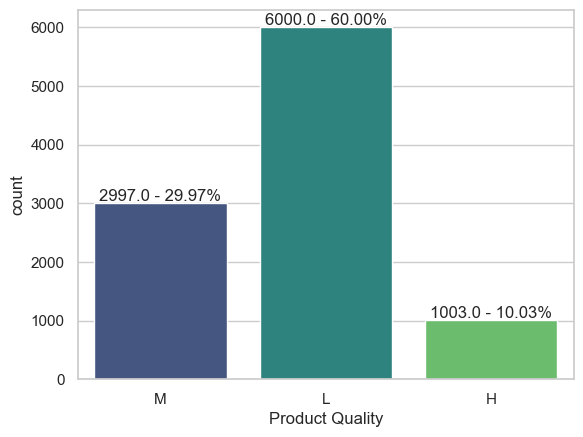

In [5]:
sns.set(style="whitegrid")
ax = sns.countplot(x="Product Quality", data=dfMachineFailures, palette='viridis')

total = float(len(dfMachineFailures))
for p in ax.patches:                   # Add percentage labels on top of each bar
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 0.2,'{} - {:.2%}'.format(height, height / total), ha='center', va='bottom')

plt.show()                             # Show the plot

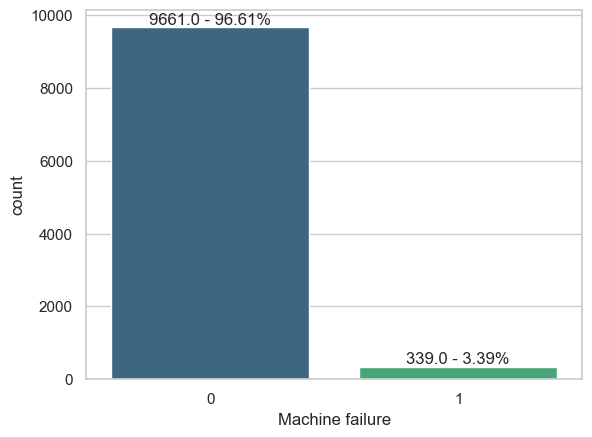

In [6]:
ax = sns.countplot(x="Machine failure", data=dfMachineFailures, palette='viridis')
total = float(len(dfMachineFailures))
for p in ax.patches:                   # Add percentage labels on top of each bar
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 0.2,'{} - {:.2%}'.format(height, height / total), ha='center', va='bottom')

plt.show()                             # Show the plot

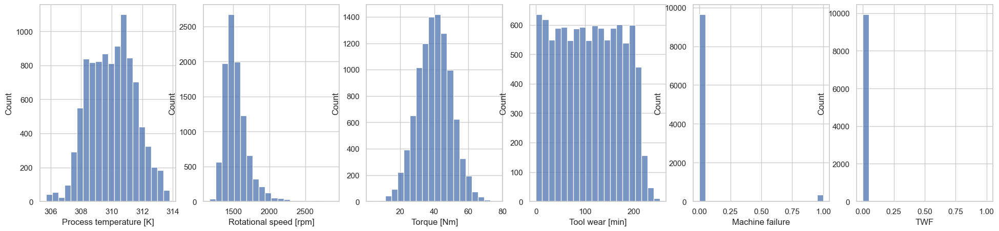

In [7]:
listLables = list(dfMachineFailures.columns)[2:8]
plt.figure(figsize=(24,5))
for idx, feature in enumerate(listLables):
    plt.subplot(1,len(listLables),idx+1)
    sns.histplot(data = dfMachineFailures, x = feature, stat = 'count', bins = 20)

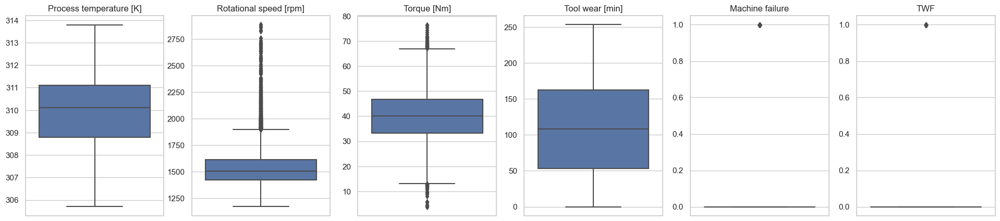

In [8]:
#outliers
plt.figure(figsize=(24,5))
for idx, feature in enumerate(listLables):
    plt.subplot(1,len(listLables),idx+1)
    sns.boxplot(data = dfMachineFailures, y = feature).set(ylabel = None, title = feature)

Correlation between failure and high Rotation speed and High and Low Torque can be seen.
There is no distinct corr between High (Air Temperature / process Temperature) and Failures, however correlation between high temperature and HDF can be observed.

It appears some failures occure under certain low torque and low Rotation speed similiarly there these both are high
Correlation between high Torque and high tool wear


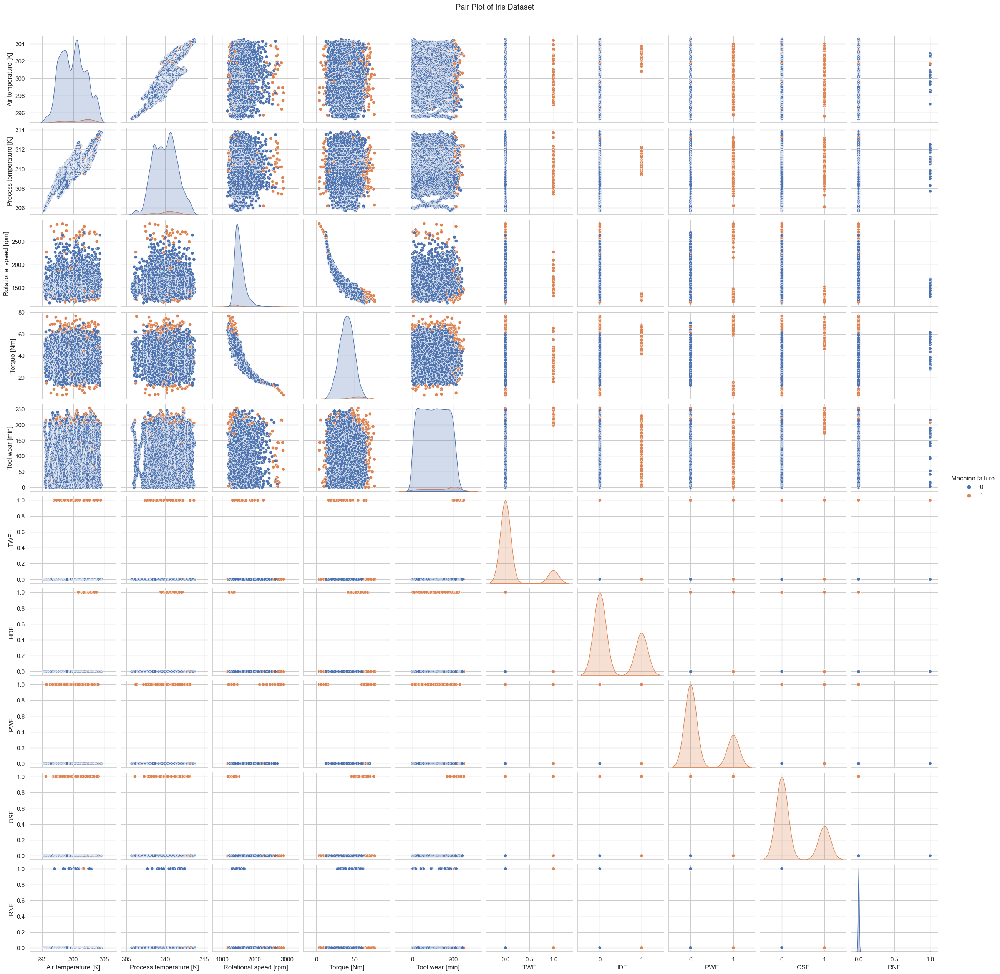

In [9]:
#sns.set_style("darkgrid")
sns.pairplot(dfMachineFailures, hue="Machine failure") #, palette="viridis")
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()
    

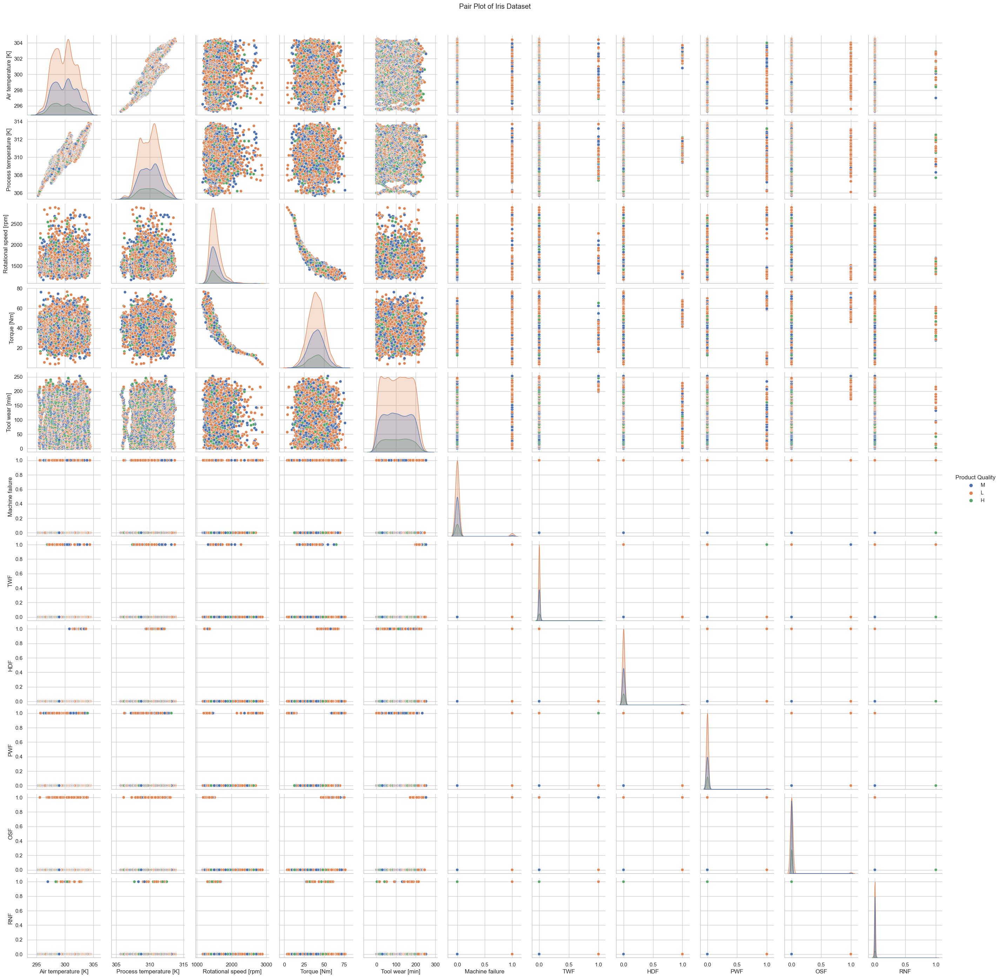

In [10]:
sns.pairplot(dfMachineFailures, hue="Product Quality") #, palette="viridis")
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()

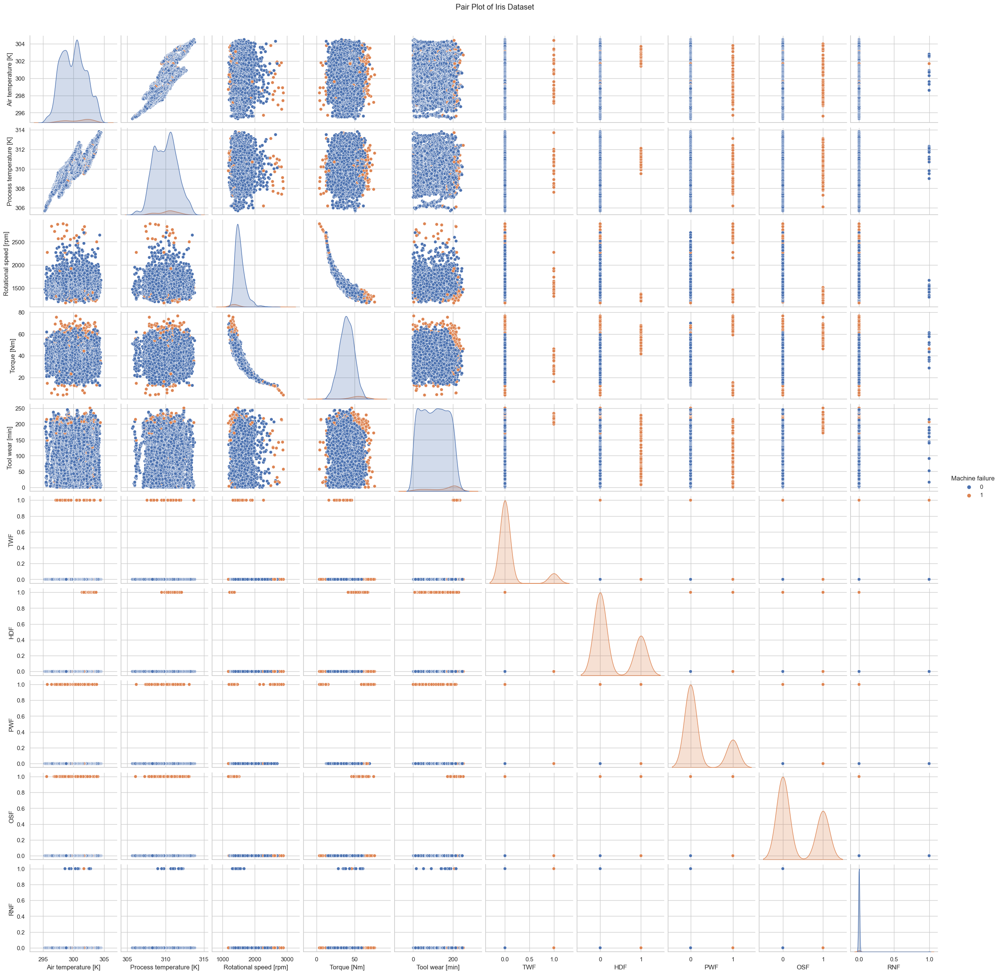

In [11]:
dfLQ = dfMachineFailures[dfMachineFailures['Product Quality'] == "L"]
sns.pairplot(dfLQ, hue="Machine failure") #, palette="viridis")
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()

<Axes: xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

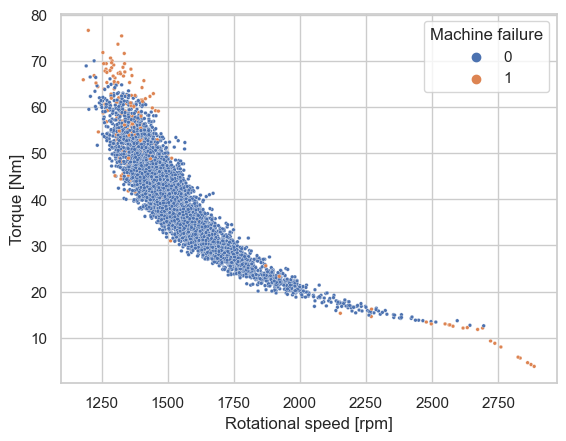

In [12]:
sns.scatterplot(x="Rotational speed [rpm]", y="Torque [Nm]", s=7,  hue="Machine failure", data=dfLQ)

<Axes: xlabel='Rotational speed [rpm]', ylabel='Tool wear [min]'>

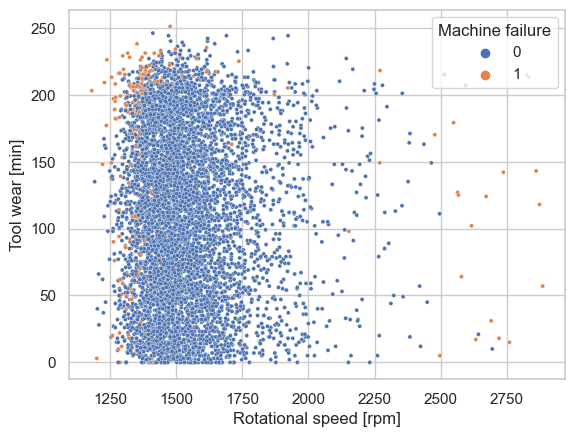

In [13]:
sns.scatterplot(x="Rotational speed [rpm]", y="Tool wear [min]", s=9,  hue="Machine failure", data=dfLQ)

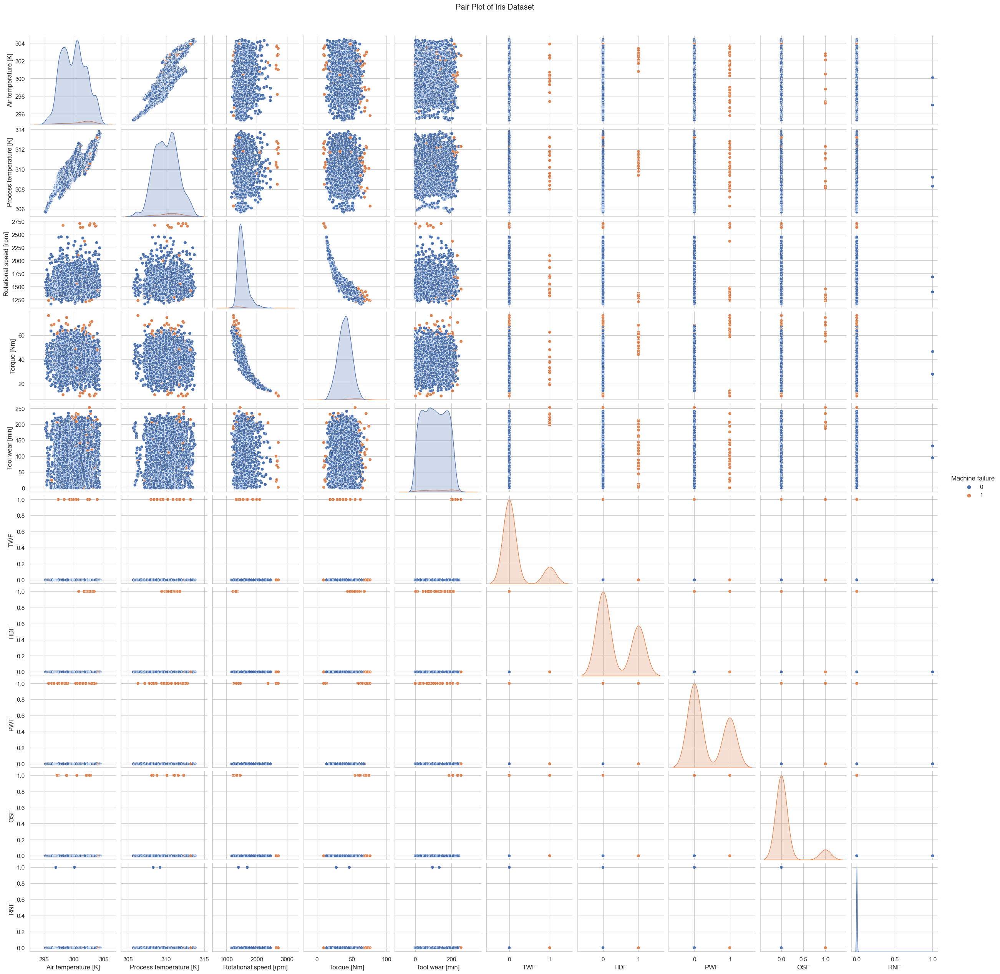

In [14]:
dfMQ = dfMachineFailures[dfMachineFailures['Product Quality'] == "M"]
sns.pairplot(dfMQ, hue="Machine failure") #, palette="viridis")
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()

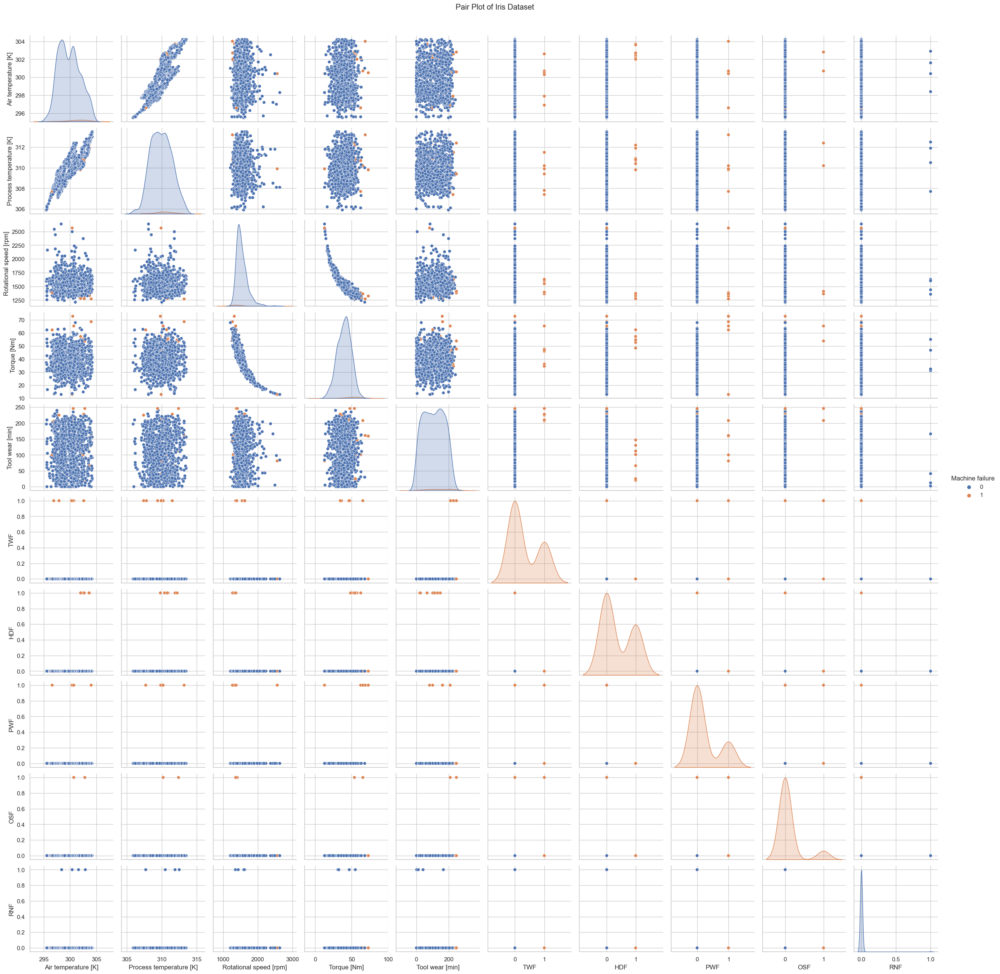

In [15]:
dfHQ = dfMachineFailures[dfMachineFailures['Product Quality'] == "H"]
sns.pairplot(dfHQ, hue="Machine failure") #, palette="viridis")
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()

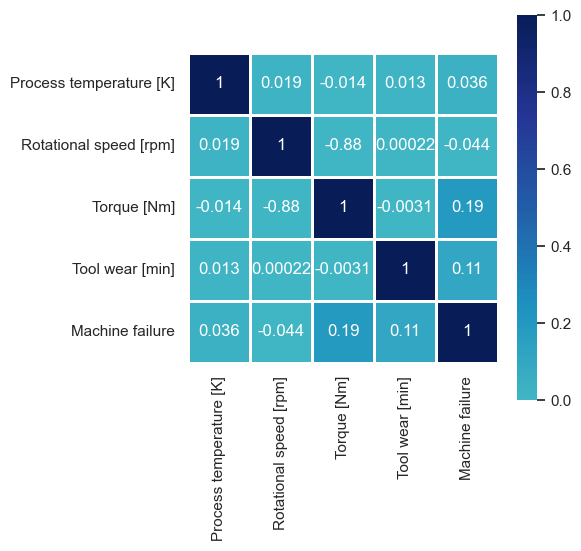

In [16]:
correlation = dfMachineFailures[listLables[:-1]].corr()
plt.figure(figsize=(5,5))
sns.heatmap(correlation, vmin=0, vmax=1, center=0, annot=True, cmap="YlGnBu", linewidths = 1.0, square=True)
plt.show()

In [17]:
def one_hot_encoder(df, columnName):
    one_hot_encoded = pd.get_dummies(dfMachineFailures[columnName], prefix= columnName)
    df = pd.concat([df, one_hot_encoded], axis=1)
    df = df.drop(columnName, axis=1)
    return df


def sacle_dataframe(df, listColumns):
    scaler = StandardScaler()
    scaledData = scaler.fit_transform(df[listColumns])
    dfScaled = pd.DataFrame(scaledData, columns=listColumns)
    df = df.drop(columns = listColumns)
    dfScaled = pd.concat([df, dfScaled], axis=1)
    return dfScaled

def plotGraphs(history):
    listTrainLoss           = history.history['accuracy']
    listTrainAccuracy       = history.history['loss']
    listValidationLoss      = history.history['val_accuracy']
    listValidationAccuracy  = history.history['val_loss']
    listEpocs = [i+1 for i in range(len(listTrainLoss))]


    dfAcc = pd.DataFrame({"Training Accuracy": listTrainAccuracy, "Validation Accuracy":listValidationAccuracy })
    dfLoss = pd.DataFrame({"Training Loss":listTrainLoss, "Validation Loss":listValidationLoss })

    fig, axes = plt.subplots(ncols=2, figsize=(10, 5))
    sns.lineplot(data = dfAcc, ax = axes[0])
    sns.lineplot(data = dfLoss, ax = axes[1]) 
    sns.set_style("darkgrid")  
    plt.show()

def plotConfusionMatrix( y_true_, y_pred_, label_):
    cm =  confusion_matrix(y_true_, y_pred_)
    sns.heatmap(cm, annot=True, fmt='g', cmap = 'Blues')
    plt.ylabel('Actual',fontsize=10)
    plt.xlabel('Predicted',fontsize=10)
    plt.title(f'Confusion Matrix [{label_}]', fontsize=12)
    plt.show()

In [18]:
dfOneHotEncoded = one_hot_encoder(dfMachineFailures, "Product Quality")

listScaleColumns = ["Air temperature [K]", "Process temperature [K]", "Rotational speed [rpm]", "Torque [Nm]", "Tool wear [min]"]
dfFailures = sacle_dataframe(dfOneHotEncoded, listScaleColumns) 
dfFailures.head()

,Machine failure,TWF,HDF,PWF,OSF,RNF,Product Quality_H,Product Quality_L,Product Quality_M,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,0,0,0,0,0,0,0,0,1,-0.952389,-0.947360,0.068185,0.282200,-1.695984
1,0,0,0,0,0,0,0,1,0,-0.902393,-0.879959,-0.729472,0.633308,-1.648852
2,0,0,0,0,0,0,0,1,0,-0.952389,-1.014761,-0.227450,0.944290,-1.617430
3,0,0,0,0,0,0,0,1,0,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009
4,0,0,0,0,0,0,0,1,0,-0.902393,-0.879959,-0.729472,0.001313,-1.554588


In [19]:
listAttributes = list(dfFailures.columns)
listAttributes.remove("Machine failure")
listTarget = ["Machine failure"]

X = dfFailures[listAttributes]
Y = dfFailures[listTarget]

#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.0066, random_state=42)
print("Train Shape: ", X_train.shape, y_train.shape)
print("Test Shape: ",  X_test.shape,  y_test.shape)


X_train_m = X_train.drop(columns=["TWF","HDF","PWF","OSF","RNF"])
X_test_m  = X_test.drop(columns=["TWF","HDF","PWF","OSF","RNF"])
print(X_train_m.shape, X_test_m.shape)

Train Shape:  (9934, 13) (9934, 1)
Test Shape:  (66, 13) (66, 1)
(9934, 8) (66, 8)


In [20]:
# listAttributes = list(dfFailures.columns)
# listAttributes.remove("type")
# listTarget = ["type"]

# X = dfFailures[listAttributes]
# y = dfFailures[listTarget]

In [21]:
dfFailures["type"] = 'None'
dfFailures["type"] = dfFailures["type"].mask((dfFailures["TWF"] == 1), "TWF")
dfFailures["type"] = dfFailures["type"].mask((dfFailures["HDF"] == 1), "HDF")
dfFailures["type"] = dfFailures["type"].mask((dfFailures["PWF"] == 1), "PWF")
dfFailures["type"] = dfFailures["type"].mask((dfFailures["OSF"] == 1), "OSF")
import tensorflow as tf
from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)

# Use the split method to get indices for training and testing sets
for train_index, test_index in sss.split(dfFailures, dfFailures['type']):
    df_train, df_test = dfFailures.iloc[train_index], dfFailures.iloc[test_index]

X_train_m = df_train
y_train_m = np.array(df_train[["Machine failure"]])
X_test_m  = df_test
y_test_m  = np.array(df_test[["Machine failure"]])

X_train_m = X_train_m.drop(columns = ["Machine failure","type", "TWF","HDF","PWF","OSF","RNF"])
X_test_m  = X_test_m.drop(columns = ["Machine failure","type", "TWF","HDF","PWF","OSF","RNF"])


# print("Train Shape: ", X_train_m.shape, y_train_m.shape)
# print("Test Shape: ",  X_test_m.shape,  y_test_m.shape)
# X_train_m[["Product Quality_H","Product Quality_L","Product Quality_M"]] = X_train_m[["Product Quality_H","Product Quality_L","Product Quality_M"]].astype(int)
# X_test_m[["Product Quality_H","Product Quality_L","Product Quality_M"]]  = X_test_m[["Product Quality_H","Product Quality_L","Product Quality_M"]].astype(int)

# X_train_m = tf.convert_to_tensor(X_train_m.values)
# X_test_m  = tf.convert_to_tensor(X_test_m.values)

# # y_train_m  = tf.convert_to_tensor(y_train_m.values)
# # y_test_m  = tf.convert_to_tensor(y_test_m.values)

In [22]:
model = Sequential()
model.add(Dense(units=8, input_dim=8, activation='relu'))
model.add(Dense(units=32, activation='relu'))
model.add(Dense(units=64, activation='relu'))
model.add(Dense(units=1, activation='sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 72        
                                                                 
 dense_1 (Dense)             (None, 32)                288       
                                                                 
 dense_2 (Dense)             (None, 64)                2112      
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 2537 (9.91 KB)
Trainable params: 2537 (9.91 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [23]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_m, y_train_m, epochs=20, batch_size=32, validation_data=(X_test_m, y_test_m))

# # Evaluate the model on the test set
# y_pred = (model.predict(X_test) > 0.5).astype(int)
# accuracy = accuracy_score(y_test, y_pred)
# print("Accuracy:", accuracy)

Epoch 1/20
282/282 [==============================] - 2s 2ms/step - loss: 0.1715 - accuracy: 0.9661 - val_loss: 0.1177 - val_accuracy: 0.9660
Epoch 2/20
282/282 [==============================] - 0s 2ms/step - loss: 0.1033 - accuracy: 0.9678 - val_loss: 0.0879 - val_accuracy: 0.9700
Epoch 3/20
282/282 [==============================] - 0s 1ms/step - loss: 0.0918 - accuracy: 0.9698 - val_loss: 0.0868 - val_accuracy: 0.9700
Epoch 4/20
282/282 [==============================] - 0s 2ms/step - loss: 0.0888 - accuracy: 0.9708 - val_loss: 0.0831 - val_accuracy: 0.9750
Epoch 5/20
282/282 [==============================] - 0s 1ms/step - loss: 0.0860 - accuracy: 0.9714 - val_loss: 0.0816 - val_accuracy: 0.9750
Epoch 6/20
282/282 [==============================] - 0s 1ms/step - loss: 0.0839 - accuracy: 0.9724 - val_loss: 0.0845 - val_accuracy: 0.9720
Epoch 7/20
282/282 [==============================] - 0s 1ms/step - loss: 0.0827 - accuracy: 0.9727 - val_loss: 0.0810 - val_accuracy: 0.9740
Epoch 

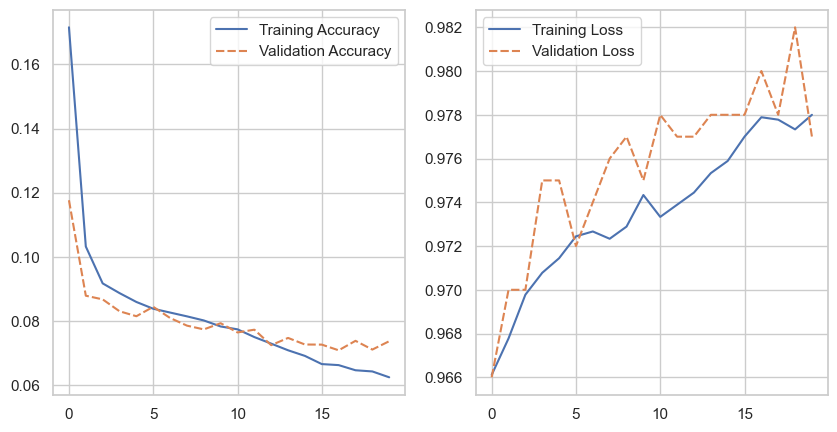

In [24]:
plotGraphs(history)

In [25]:
train_score = model.evaluate(X_train_m, y_train_m, verbose= 1)
test_score  = model.evaluate(X_test_m, y_test_m, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

32/32 [==============================] - 0s 1ms/step - loss: 0.0738 - accuracy: 0.9770
Train Loss:  0.061622124165296555
Train Accuracy:  0.9773333072662354
--------------------
Test Loss:  0.07377509772777557
Test Accuracy:  0.9769999980926514


32/32 [==============================] - 0s 839us/step


Text(0.5, 1.0, 'Confusion Matrix')

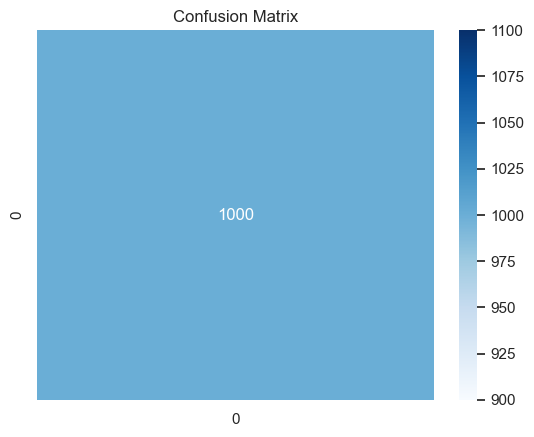

In [26]:
y_true = np.array(y_test_m)
y_pred = model.predict(X_test_m)

y_pred = np.argmax(y_pred , axis=1)
y_true = np.argmax(y_true , axis=1)

cm =  confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='g', cmap = 'Blues').set_title("Confusion Matrix")

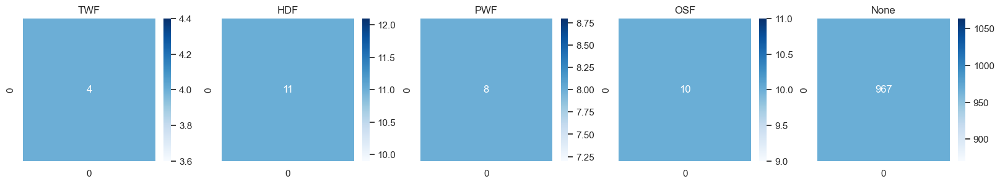

In [27]:
#one_hot_encoded = np.array(df_test["type"])
#decoded_labels  = np.argmax(one_hot_encoded, axis=1).tolist()
#df_ = pd.DataFrame(decoded_labels, columns=["failure"]).astype(str)
#df_ = df_.replace({"failure":{"0":"TWF", "1":"HDF", "2":"PWF" , "3":"OSF", "4":"RNF"}}, regex=True)

listLabels = list(df_test["type"])
listYtrue  = list(y_true)
listYpred  = list(y_pred)

df_ = pd.DataFrame({"label":listLabels, "test": listYtrue, "pred": listYpred})

listUniqueLabels =  list(df_["label"].unique())
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 3))
listUniqueLabels = ["TWF", "HDF", "PWF", "OSF","None"]
for i, label in enumerate(listUniqueLabels):
    dfL = df_[df_["label"] == label]
    y_pred_ = np.array(list(dfL["pred"]))
    y_true_ = np.array(list(dfL["test"]))
    cm =  confusion_matrix(y_true_, y_pred_)
    sns.heatmap(cm, annot=True, fmt='g', cmap = 'Blues', ax=axes[i]).set_title(label)
plt.show()